In [1]:
import os
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE']='false'

import jax

from jax import random, jit, vmap, grad
from jax import numpy as jnp
from jax.lax import cond

import astropy
import numpy as np
import healpy as hp

import h5py
import astropy.units as u

from astropy.cosmology import Planck15, FlatLambdaCDM, z_at_value
import astropy.constants as constants
from jax.scipy.special import logsumexp
from scipy.interpolate import interp1d
from scipy.stats import gaussian_kde
from tqdm import tqdm
from models import *

import matplotlib
%matplotlib inline

import matplotlib.pyplot as plt
matplotlib.rcParams['font.family'] = 'Times New Roman'
matplotlib.rcParams['font.sans-serif'] = ['Bitstream Vera Sans']
matplotlib.rcParams['text.usetex'] = False
matplotlib.rcParams['mathtext.fontset'] = 'cm'
matplotlib.rcParams['figure.figsize'] = (16.0, 10.0)
matplotlib.rcParams['axes.unicode_minus'] = False

import seaborn as sns
sns.set_context('talk')
sns.set_style('ticks')
sns.set_palette('colorblind')
c=sns.color_palette('colorblind')

jax.config.update("jax_enable_x64", True)
jax.config.update('jax_default_matmul_precision', 'highest')


2025-02-17 13:18:11.621861: W external/xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.3 which is older than the PTX compiler version 12.6.77. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.
100%|██████████| 50/50 [00:00<00:00, 223.26it/s]


In [2]:
from jaxinterp2d import interp2d, CartesianGrid

H0Planck = Planck15.H0.value
Om0Planck = Planck15.Om0

zMax = 5
zgrid = jnp.expm1(jnp.linspace(jnp.log(1), jnp.log(zMax+1), 500))
Om0grid = jnp.linspace(Om0Planck-0.1,Om0Planck+0.1,50)

cosmo = FlatLambdaCDM(H0=H0Planck,Om0=Planck15.Om0)
speed_of_light = constants.c.to('km/s').value

rs = []
for Om0 in tqdm(Om0grid):
    cosmo = FlatLambdaCDM(H0=H0Planck,Om0=Om0)
    rs.append(cosmo.comoving_distance(zgrid).to(u.Mpc).value)

rs = jnp.asarray(rs)
rs = rs.reshape(len(Om0grid),len(zgrid))

@jit
def E(z,Om0=Om0Planck):
    return jnp.sqrt(Om0*(1+z)**3 + (1.0-Om0))

@jit
def r_of_z(z,H0,Om0=Om0Planck):
    return interp2d(Om0,z,Om0grid,zgrid,rs)*(H0Planck/H0)

@jit
def dL_of_z(z,H0,Om0=Om0Planck):
    return (1+z)*r_of_z(z,H0,Om0)

@jit
def z_of_dL(dL,H0,Om0=Om0Planck):
    return jnp.interp(dL,dL_of_z(zgrid,H0,Om0),zgrid)

@jit
def dV_of_z(z,H0,Om0=Om0Planck):
    return speed_of_light*r_of_z(z,H0,Om0)**2/(H0*E(z,Om0))

@jit
def ddL_of_z(z,dL,H0,Om0=Om0Planck):
    return dL/(1+z) + speed_of_light*(1+z)/(H0*E(z,Om0))

100%|██████████| 50/50 [00:00<00:00, 743.76it/s]


In [3]:
from gwpopulation.models import mass as mass_models
import bilby
from scipy.integrate import cumtrapz

Nsamples = 10000

underlying_pop = {"mmin": 6, "alpha": 4, "beta_q": 1.5, "mmax": 70, "lam": 0.04, "mpp": 35, "sigpp": 4, "delta_m": 4.0, "lamb": 3}

ms = np.linspace(0.1, 150, 1000)

m1_pdf = mass_models.SinglePeakSmoothedMassDistribution().p_m1({"mass_1":ms}, 
                                                        alpha=underlying_pop["alpha"],
                                                        mmin=underlying_pop["mmin"],
                                                        delta_m=underlying_pop["delta_m"],
                                                        mpp=underlying_pop["mpp"],                                             
                                                        sigpp=underlying_pop["sigpp"],
                                                        mmax=underlying_pop["mmax"],
                                                        lam=underlying_pop["lam"])


m1_cdf = cumtrapz(m1_pdf, ms, initial=0)
m1_cdf/=m1_cdf[-1]

m1_samples = interp1d(m1_cdf,ms)(np.random.rand(Nsamples))

m1_samples = m1_samples[np.where(m1_samples>underlying_pop["mmin"])[0]]
Nsamples = len(m1_samples)


q_samples = np.array([bilby.core.prior.analytical.PowerLaw(alpha=underlying_pop['beta_q'],
                                                           minimum=underlying_pop["mmin"]/m1, maximum=1).sample(size=1)[0] for m1 in m1_samples])


m1s,m2s = np.meshgrid(ms,ms)


pm1s = mass_models.SinglePeakSmoothedMassDistribution().p_m1( {"mass_1":m1s},
                                                        alpha=underlying_pop["alpha"],
                                                        mmin=underlying_pop["mmin"],
                                                        delta_m=underlying_pop["delta_m"],
                                                        mpp=underlying_pop["mpp"],                                             
                                                        sigpp=underlying_pop["sigpp"],
                                                        mmax=underlying_pop["mmax"],
                                                        lam=underlying_pop["lam"])
pqs = mass_models.SinglePeakSmoothedMassDistribution().p_q({"mass_1":m1s,"mass_ratio":m2s/m1s},beta=underlying_pop['beta_q'],delta_m=underlying_pop["delta_m"],mmin=underlying_pop["mmin"])
pm1m2s = pm1s*pqs/m1s
pm1m2s[m1s<m2s]=0.
pm1m2s/=np.trapz(np.trapz(pm1m2s,ms,axis=0),ms)

pm1=np.trapz(pm1m2s,ms,axis=0)
pm2=np.trapz(pm1m2s,ms,axis=1)

pm1 = pm1/np.trapz(pm1,ms)
pm2 = pm2/np.trapz(pm2,ms)

/tmp/ipykernel_3590784/2742483424.py:21: DeprecationWarning: 'scipy.integrate.cumtrapz' is deprecated in favour of 'scipy.integrate.cumulative_trapezoid' and will be removed in SciPy 1.14.0
  m1_cdf = cumtrapz(m1_pdf, ms, initial=0)
/hildafs/home/magana/tmp_ondemand_hildafs_phy230014p_symlink/magana/.conda/envs/jax/lib/python3.11/site-packages/gwpopulation/models/mass.py:631: RuntimeWarning: invalid value encountered in divide
  p_q /= self.norm_p_q(beta=beta, mmin=mmin, delta_m=delta_m)


In [4]:
import pickle
from dynesty.utils import resample_equal
from dynesty import NestedSampler, DynamicNestedSampler
import multiprocessing as multi
import corner 

dlogz_plbump = []
dlogz_plbump_err = []
post_samples_plbump = []
for k in range(100):

    file = open('plbump/plbump-sims_'+str(k),'rb')
    dres = pickle.load(file)

    dlogZdynesty = dres.logz[-1]        # value of logZ
    dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ
    
    dlogz_plbump.append(dlogZdynesty)
    dlogz_plbump_err.append(dlogZerrdynesty)

    # output marginal likelihood
    print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

    # get the posterior samples
    dweights = np.exp(dres['logwt'] - dres['logz'][-1])
    dpostsamples = resample_equal(dres.samples, dweights)
    post_samples_plbump.append(dpostsamples)
    print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))


Marginalised evidence (using dynamic sampler) is -1337.7814975733552 ± 0.18290013211098755
Number of posterior samples (using dynamic sampler) is 9803
Marginalised evidence (using dynamic sampler) is -1271.2444494511803 ± 0.19130632385350488
Number of posterior samples (using dynamic sampler) is 10238
Marginalised evidence (using dynamic sampler) is -1332.6964645595458 ± 0.2023746854550117
Number of posterior samples (using dynamic sampler) is 10769
Marginalised evidence (using dynamic sampler) is -1279.7891905530548 ± 0.18680760216895212
Number of posterior samples (using dynamic sampler) is 10217
Marginalised evidence (using dynamic sampler) is -1334.2518749427418 ± 0.199529243022181
Number of posterior samples (using dynamic sampler) is 10485
Marginalised evidence (using dynamic sampler) is -1279.9361686141729 ± 0.19717519760731295
Number of posterior samples (using dynamic sampler) is 10643
Marginalised evidence (using dynamic sampler) is -1303.8194254583923 ± 0.19669936286473974
N

100%|██████████| 100/100 [00:00<00:00, 540.30it/s]


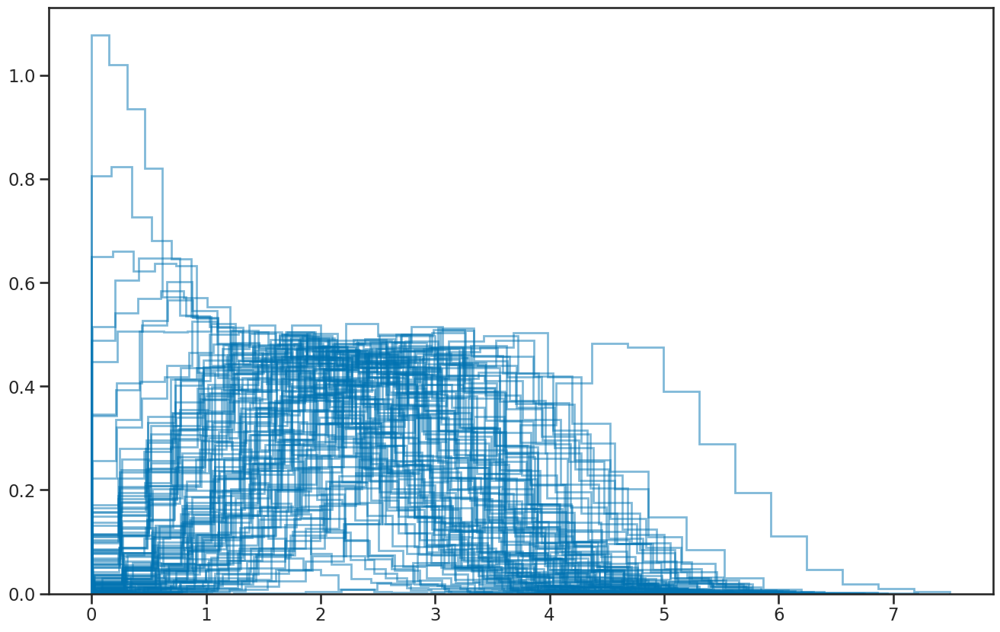

In [5]:
for k in tqdm(range(len(post_samples_plbump))):
    dpostsamples = post_samples_plbump[k]
    
    plt.hist(dpostsamples[:, 0], color=c[0], histtype='step', linewidth=2, bins=20, density=True, alpha=0.5 )
plt.show()

100%|██████████| 100/100 [00:04<00:00, 24.74it/s]


<Figure size 1600x1000 with 0 Axes>

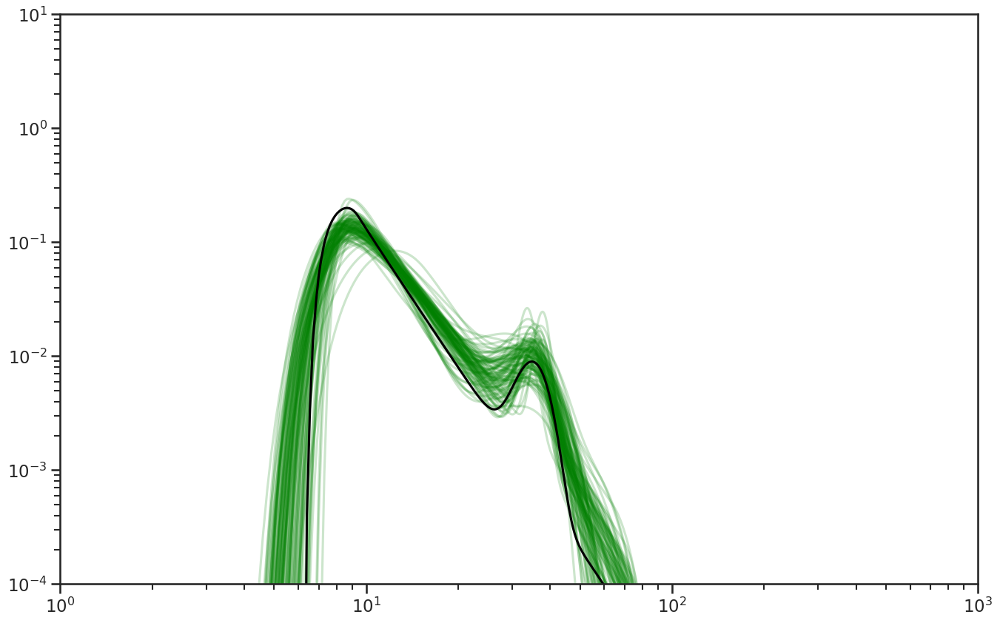

In [7]:
@jit
def log_pm1m2_powerlaw_peak(m1,m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,mu,sigma,f1,beta):
    log_dNdm1 = logpm1_powerlaw_peak(m1,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,mu,sigma,f1)
    log_dNdm2 = logpm1_powerlaw_peak(m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,mu,sigma,f1)
    log_fq = logfq(m1,m2,beta)
    return log_dNdm1 + log_dNdm2 + log_fq 

plbump_pm1s = []
plbump_pm2s = []
plt.figure()
for k in tqdm(range(len(post_samples_plbump))):
    
    dpostsamples = np.median(post_samples_plbump[k], axis=0)
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    beta = dpostsamples[6]
    mu = dpostsamples[7]
    sigma = dpostsamples[8]
    f1 = dpostsamples[9]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_peak(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mu,sigma,f1,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plbump_pm1s.append(pm1_fit)
    plbump_pm2s.append(pm2_fit)
    plt.loglog(ms,pm1_fit,alpha=0.2,color='green')    
plt.loglog(ms,pm1,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()

100%|██████████| 100/100 [00:03<00:00, 31.38it/s]


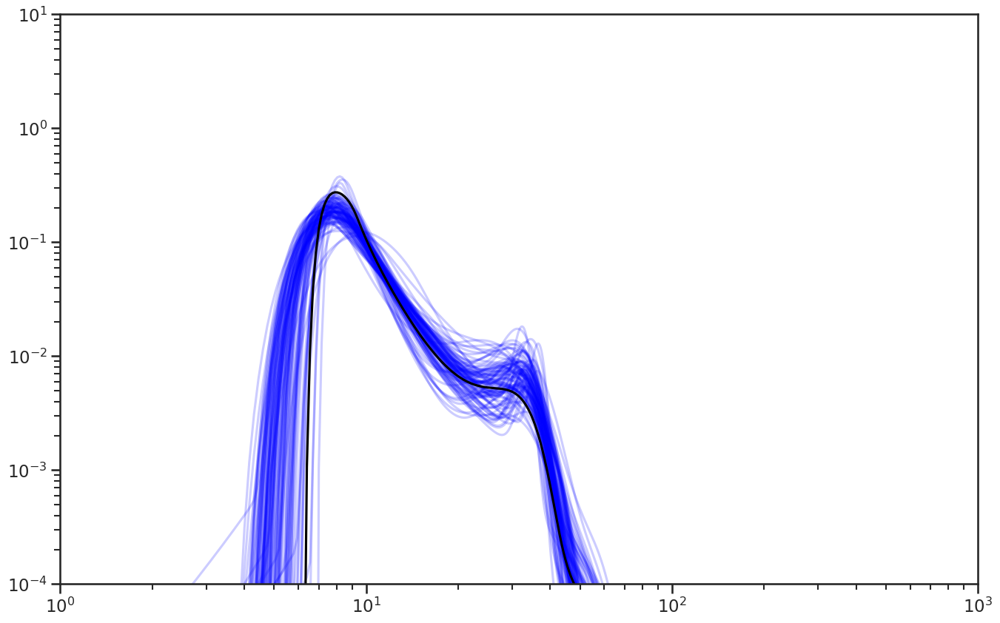

In [8]:

plt.figure()
for k in tqdm(range(len(post_samples_plbump))):
    
    dpostsamples = np.median(post_samples_plbump[k], axis=0)
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    beta = dpostsamples[6]
    mu = dpostsamples[7]
    sigma = dpostsamples[8]
    f1 = dpostsamples[9]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_peak(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mu,sigma,f1,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plt.loglog(ms,pm2_fit,alpha=0.2,color='blue')    
plt.loglog(ms,pm2,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()

In [9]:
dlogz_plplbump = []
dlogz_plplbump_err = []
post_samples_plplbump = []
for k in range(100):

    file = open('plplbump/plplbump-sims_'+str(k),'rb')
    dres = pickle.load(file)

    dlogZdynesty = dres.logz[-1]        # value of logZ
    dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ
    
    dlogz_plplbump.append(dlogZdynesty)
    dlogz_plplbump_err.append(dlogZerrdynesty)

    # output marginal likelihood
    print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

    # get the posterior samples
    dweights = np.exp(dres['logwt'] - dres['logz'][-1])
    dpostsamples = resample_equal(dres.samples, dweights)
    post_samples_plplbump.append(dpostsamples)
    print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))


Marginalised evidence (using dynamic sampler) is -1341.005774008525 ± 0.20625231492487348
Number of posterior samples (using dynamic sampler) is 11016
Marginalised evidence (using dynamic sampler) is -1276.2188861073332 ± 0.21716257448173135
Number of posterior samples (using dynamic sampler) is 13816
Marginalised evidence (using dynamic sampler) is -1337.8720119736831 ± 0.2162872304478508
Number of posterior samples (using dynamic sampler) is 13236
Marginalised evidence (using dynamic sampler) is -1285.4224184876107 ± 0.22702559529265692
Number of posterior samples (using dynamic sampler) is 13162
Marginalised evidence (using dynamic sampler) is -1338.6985032439852 ± 0.20698447154433564
Number of posterior samples (using dynamic sampler) is 12700
Marginalised evidence (using dynamic sampler) is -1281.7845105534868 ± 0.2170542946252003
Number of posterior samples (using dynamic sampler) is 14530
Marginalised evidence (using dynamic sampler) is -1307.5878012625542 ± 0.21647809876620042


100%|██████████| 100/100 [00:00<00:00, 529.82it/s]


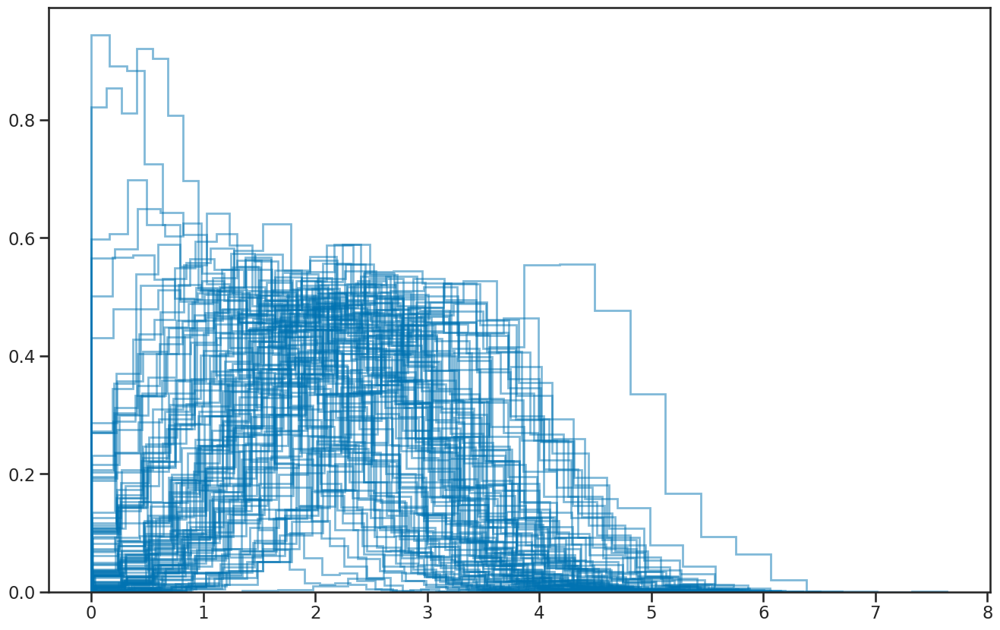

In [10]:
for k in tqdm(range(len(post_samples_plplbump))):
    dpostsamples = post_samples_plplbump[k]
    
    plt.hist(dpostsamples[:, 0], color=c[0], histtype='step', linewidth=2, bins=20, density=True, alpha=0.5 )
plt.show()

100%|██████████| 100/100 [00:00<00:00, 506.62it/s]


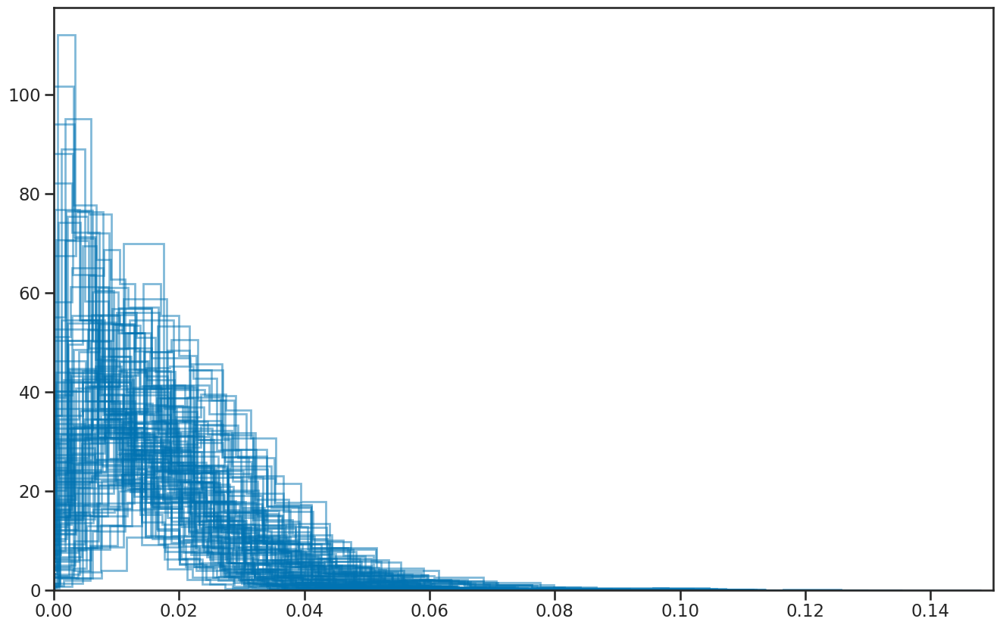

In [11]:
for k in tqdm(range(len(post_samples_plplbump))):
    dpostsamples = post_samples_plplbump[k]
    
    plt.hist(1-dpostsamples[:, -2]-dpostsamples[:, -1], color=c[0], histtype='step', linewidth=2, bins=20, density=True, alpha=0.5 )
    
plt.xlim(0,0.15)
plt.show()

100%|██████████| 100/100 [00:04<00:00, 23.25it/s]


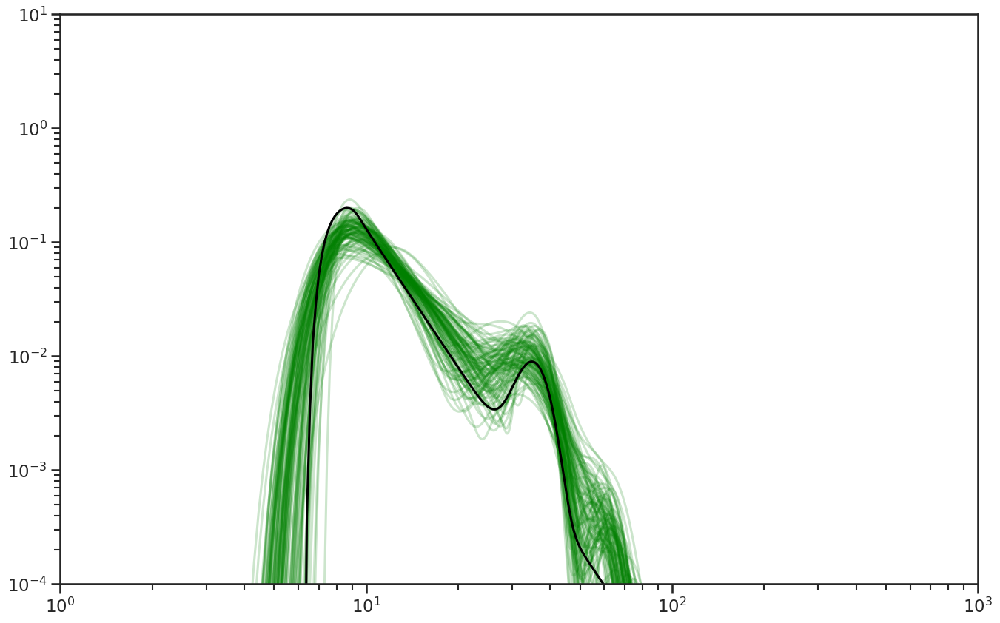

In [12]:
def log_pm1m2_powerlaw_powerlaw_peak(m1,m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2,beta):
    log_dNdm1 = logpm1_powerlaw_powerlaw_peak(m1,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2)
    log_dNdm2 = logpm1_powerlaw_powerlaw_peak(m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2)
    log_fq = logfq(m1,m2,beta)
    return log_dNdm1 + log_dNdm2 + log_fq

plplbump_pm1s = []
plplbump_pm2s = []

plt.figure()
for k in tqdm(range(len(post_samples_plplbump))):
    
    dpostsamples = np.median(post_samples_plplbump[k], axis=0)
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    mmin_2 = dpostsamples[6]
    mmax_2 = dpostsamples[7]
    alpha_2 = dpostsamples[8]
    dm_mmin_2 = dpostsamples[9]
    dm_mmax_2 = dpostsamples[10]
    beta = dpostsamples[11]
    mu = dpostsamples[12]
    sigma = dpostsamples[13]
    f1 = dpostsamples[14]
    f2 = dpostsamples[15]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_powerlaw_peak(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mmin_2,mmax_2,alpha_2,dm_mmin_2,dm_mmax_2,mu,sigma,f1,f2,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plplbump_pm1s.append(pm1_fit)
    plplbump_pm2s.append(pm2_fit)
    plt.loglog(ms,pm1_fit,alpha=0.2,color='green')    
plt.loglog(ms,pm1,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()

100%|██████████| 100/100 [00:03<00:00, 28.95it/s]


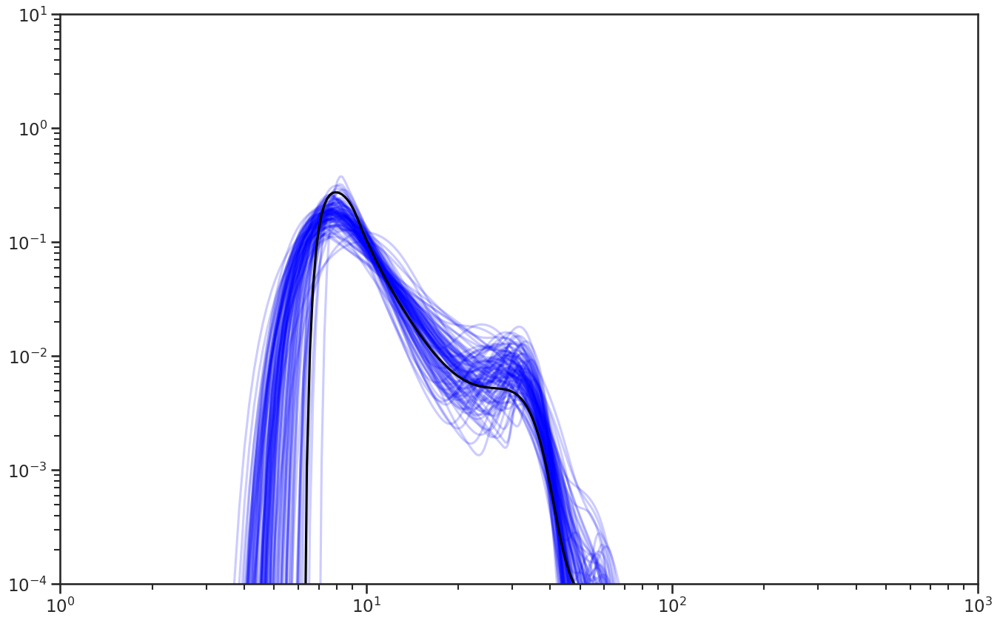

In [13]:

plt.figure()
for k in tqdm(range(len(post_samples_plplbump))):
    
    dpostsamples = np.median(post_samples_plplbump[k], axis=0)
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    mmin_2 = dpostsamples[6]
    mmax_2 = dpostsamples[7]
    alpha_2 = dpostsamples[8]
    dm_mmin_2 = dpostsamples[9]
    dm_mmax_2 = dpostsamples[10]
    beta = dpostsamples[11]
    mu = dpostsamples[12]
    sigma = dpostsamples[13]
    f1 = dpostsamples[14]
    f2 = dpostsamples[15]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_powerlaw_peak(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mmin_2,mmax_2,alpha_2,dm_mmin_2,dm_mmax_2,mu,sigma,f1,f2,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plt.loglog(ms,pm2_fit,alpha=0.2,color='blue')    
plt.loglog(ms,pm2,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()

In [14]:
dlogz_plpl = []
dlogz_plpl_err = []
post_samples_plpl = []

for k in range(100):

    file = open('plpl/plpl-sims_'+str(k),'rb')
    dres = pickle.load(file)

    dlogZdynesty = dres.logz[-1]        # value of logZ
    dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ
    
    dlogz_plpl.append(dlogZdynesty)
    dlogz_plpl_err.append(dlogZerrdynesty)

    # output marginal likelihood
    print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

    # get the posterior samples
    dweights = np.exp(dres['logwt'] - dres['logz'][-1])
    dpostsamples = resample_equal(dres.samples, dweights)
    post_samples_plpl.append(dpostsamples)
    print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))


Marginalised evidence (using dynamic sampler) is -1337.349046063463 ± 0.17595774591759447
Number of posterior samples (using dynamic sampler) is 9249
Marginalised evidence (using dynamic sampler) is -1272.1567692235114 ± 0.19219591326685873
Number of posterior samples (using dynamic sampler) is 10160
Marginalised evidence (using dynamic sampler) is -1334.3732996442513 ± 0.19439229345672226
Number of posterior samples (using dynamic sampler) is 10796
Marginalised evidence (using dynamic sampler) is -1282.2365834222123 ± 0.20619608171095816
Number of posterior samples (using dynamic sampler) is 11609
Marginalised evidence (using dynamic sampler) is -1334.8517073560763 ± 0.1924942057163434
Number of posterior samples (using dynamic sampler) is 10079
Marginalised evidence (using dynamic sampler) is -1276.981294262031 ± 0.20285995579441005
Number of posterior samples (using dynamic sampler) is 10912
Marginalised evidence (using dynamic sampler) is -1305.1399051648343 ± 0.19891734280903411
N

100%|██████████| 100/100 [00:00<00:00, 524.22it/s]


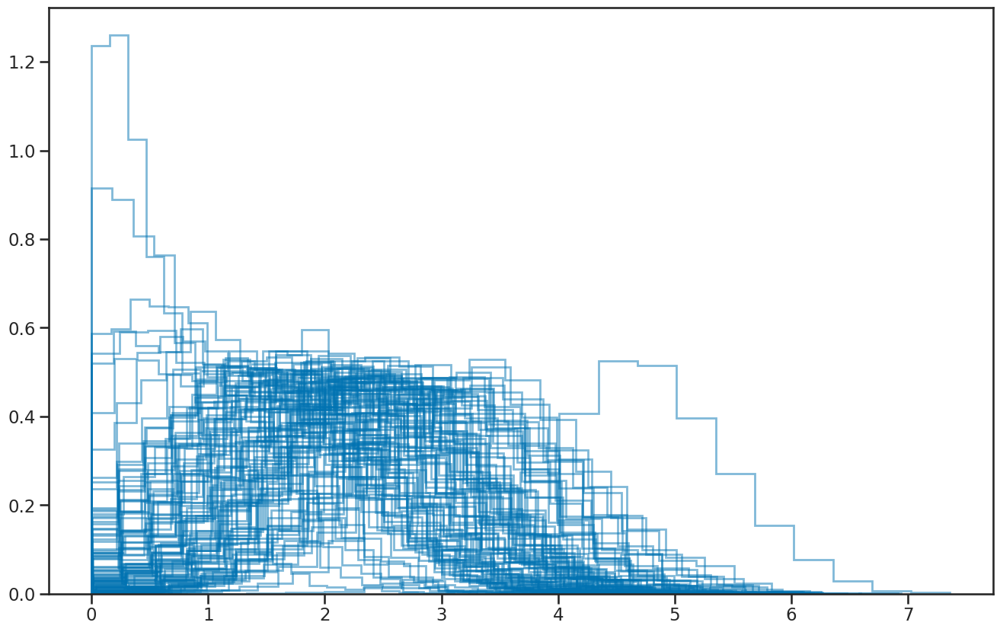

In [15]:
for k in tqdm(range(len(post_samples_plpl))):
    dpostsamples = post_samples_plpl[k]
    
    plt.hist(dpostsamples[:, 0], color=c[0], histtype='step', linewidth=2, bins=20, density=True, alpha=0.5 )
plt.show()

100%|██████████| 100/100 [00:03<00:00, 25.89it/s]


<Figure size 1600x1000 with 0 Axes>

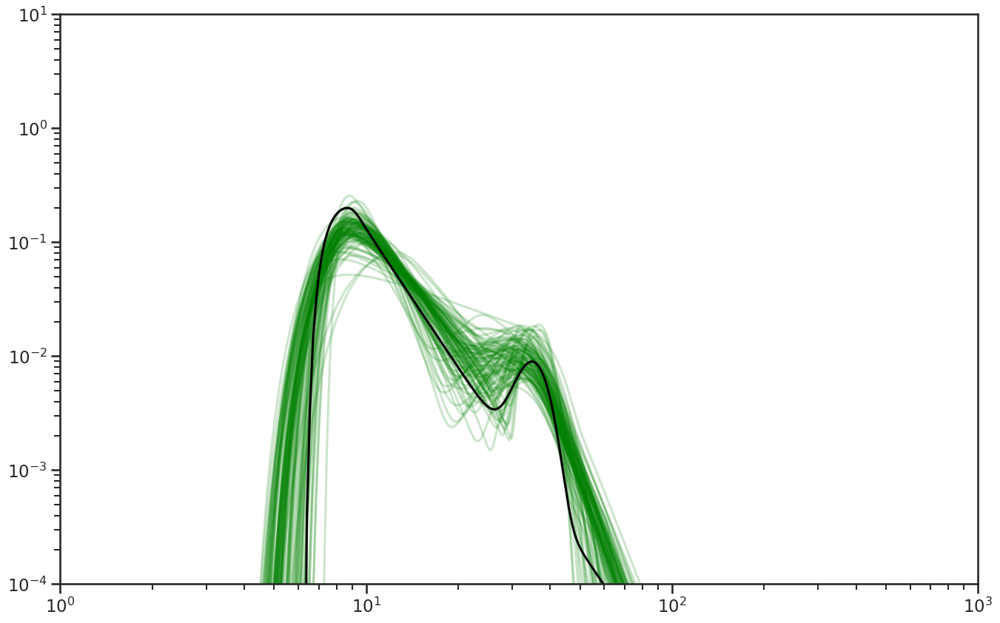

In [17]:
@jit
def log_pm1m2_powerlaw_powerlaw(m1,m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,f1,beta):
    log_dNdm1 = logpm1_powerlaw_powerlaw(m1,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,f1)
    log_dNdm2 = logpm1_powerlaw_powerlaw(m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,f1)
    log_fq = logfq(m1,m2,beta)

    return log_dNdm1 + log_dNdm2 + log_fq

plpl_pm1s = []
plpl_pm2s = []
plt.figure()
for k in tqdm(range(len(post_samples_plpl))):
    
    dpostsamples = np.median(post_samples_plpl[k], axis=0)
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    mmin_2 = dpostsamples[6]
    mmax_2 = dpostsamples[7]
    alpha_2 = dpostsamples[8]
    dm_mmin_2 = dpostsamples[9]
    dm_mmax_2 = dpostsamples[10]
    beta = dpostsamples[11]
    f1 = dpostsamples[12]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_powerlaw(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mmin_2,mmax_2,alpha_2,dm_mmin_2,dm_mmax_2,f1,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plpl_pm1s.append(pm1_fit)
    plpl_pm2s.append(pm2_fit)
    plt.loglog(ms,pm1_fit,alpha=0.2,color='green')    
plt.loglog(ms,pm1,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()

100%|██████████| 100/100 [00:03<00:00, 32.86it/s]


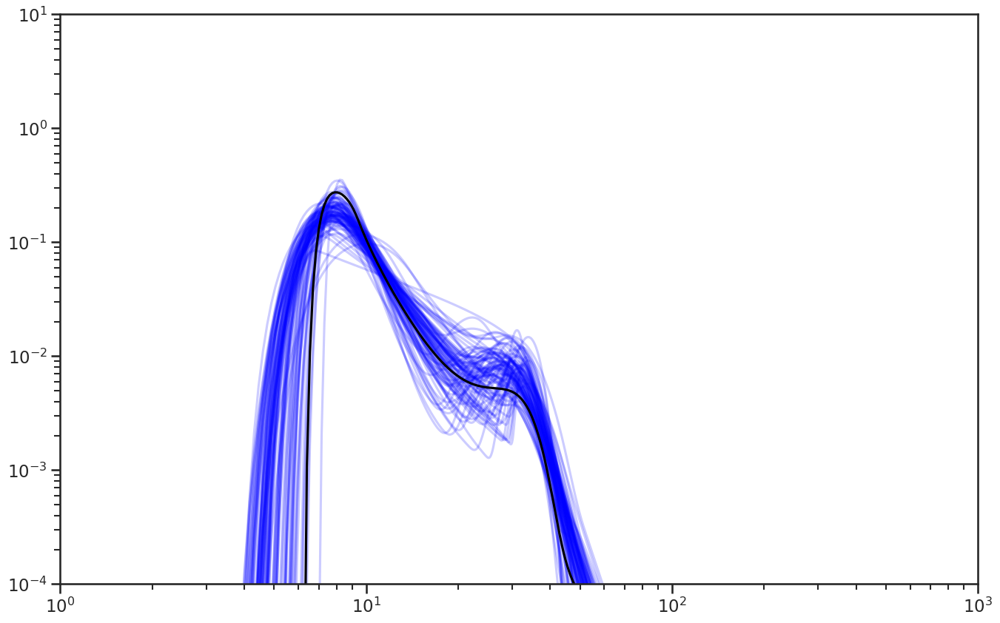

In [18]:

plt.figure()
for k in tqdm(range(len(post_samples_plpl))):
    
    dpostsamples = np.median(post_samples_plpl[k], axis=0)
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    mmin_2 = dpostsamples[6]
    mmax_2 = dpostsamples[7]
    alpha_2 = dpostsamples[8]
    dm_mmin_2 = dpostsamples[9]
    dm_mmax_2 = dpostsamples[10]
    beta = dpostsamples[11]
    f1 = dpostsamples[12]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_powerlaw(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mmin_2,mmax_2,alpha_2,dm_mmin_2,dm_mmax_2,f1,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plt.loglog(ms,pm2_fit,alpha=0.2,color='blue')    
plt.loglog(ms,pm2,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()

In [19]:
dlogz_plbump_ = np.array(dlogz_plbump)/np.log(10)
dlogz_plplbump_ = np.array(dlogz_plplbump)/np.log(10)
dlogz_plpl_ = np.array(dlogz_plpl)/np.log(10)


logBF_plplbump = dlogz_plplbump_ - dlogz_plbump_
logBF_plpl = dlogz_plpl_ - dlogz_plbump_

In [20]:
import pickle
from dynesty.utils import resample_equal
from dynesty import NestedSampler, DynamicNestedSampler
import multiprocessing as multi
import corner 

dlogz_plbump_GWTC3 = []
dlogz_plbump_err_GWTC3  = []
post_samples_plbump_GWTC3  = []

file = open('../PLB','rb')
dres = pickle.load(file)

dlogZdynesty = dres.logz[-1]        # value of logZ
dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ

dlogz_plbump_GWTC3.append(dlogZdynesty)
dlogz_plbump_err_GWTC3.append(dlogZerrdynesty)

# output marginal likelihood
print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

# get the posterior samples
dweights = np.exp(dres['logwt'] - dres['logz'][-1])
dpostsamples = resample_equal(dres.samples, dweights)
post_samples_plbump_GWTC3.append(dpostsamples)
print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))

dlogz_plplbump_GWTC3 = []
dlogz_plplbump_err_GWTC3 = []
post_samples_plplbump_GWTC3 = []

file = open('../PLPLB','rb')
dres = pickle.load(file)

dlogZdynesty = dres.logz[-1]        # value of logZ
dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ

dlogz_plplbump_GWTC3.append(dlogZdynesty)
dlogz_plplbump_err_GWTC3.append(dlogZerrdynesty)

# output marginal likelihood
print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

# get the posterior samples
dweights = np.exp(dres['logwt'] - dres['logz'][-1])
dpostsamples = resample_equal(dres.samples, dweights)
post_samples_plplbump_GWTC3.append(dpostsamples)
print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))

dlogz_plpl_GWTC3 = []
dlogz_plpl_err_GWTC3 = []
post_samples_plpl_GWTC3 = []

file = open('../PLPL','rb')
dres = pickle.load(file)

dlogZdynesty = dres.logz[-1]        # value of logZ
dlogZerrdynesty = dres.logzerr[-1]  # estimate of the statistcal uncertainty on logZ

dlogz_plpl_GWTC3.append(dlogZdynesty)
dlogz_plpl_err_GWTC3.append(dlogZerrdynesty)

# output marginal likelihood
print('Marginalised evidence (using dynamic sampler) is {} ± {}'.format(dlogZdynesty, dlogZerrdynesty))

# get the posterior samples
dweights = np.exp(dres['logwt'] - dres['logz'][-1])
dpostsamples = resample_equal(dres.samples, dweights)
post_samples_plpl_GWTC3.append(dpostsamples)
print('Number of posterior samples (using dynamic sampler) is {}'.format(dpostsamples.shape[0]))


Marginalised evidence (using dynamic sampler) is -1519.508137992134 ± 0.05788562960409826
Number of posterior samples (using dynamic sampler) is 69148
Marginalised evidence (using dynamic sampler) is -1518.8368810963589 ± 0.06394353443738376
Number of posterior samples (using dynamic sampler) is 69693
Marginalised evidence (using dynamic sampler) is -1518.9471207215815 ± 0.05905599152618848
Number of posterior samples (using dynamic sampler) is 67810


In [21]:
dlogz_plbump_gwtc3 = dlogz_plbump_GWTC3[0]/np.log(10) #-1541.0868426782517 ± 0.11473619570366217
dlogz_plplbump_gwtc3 = dlogz_plplbump_GWTC3[0]/np.log(10) #-1540.9587754964505 ± 0.12321255167507217
dlogz_plpl_gwtc3 = dlogz_plpl_GWTC3[0]/np.log(10) #-1540.5063649973756 ± 0.11017407985356721

logBF_plplbump_gwtc3 = dlogz_plplbump_gwtc3 - dlogz_plbump_gwtc3
logBF_plpl_gwtc3 = dlogz_plpl_gwtc3 - dlogz_plbump_gwtc3
print(logBF_plplbump_gwtc3)
print(logBF_plpl_gwtc3)
print(logBF_plplbump_gwtc3 - logBF_plpl_gwtc3)

0.29152316577460624
0.24364670485340412
0.047876460921202124


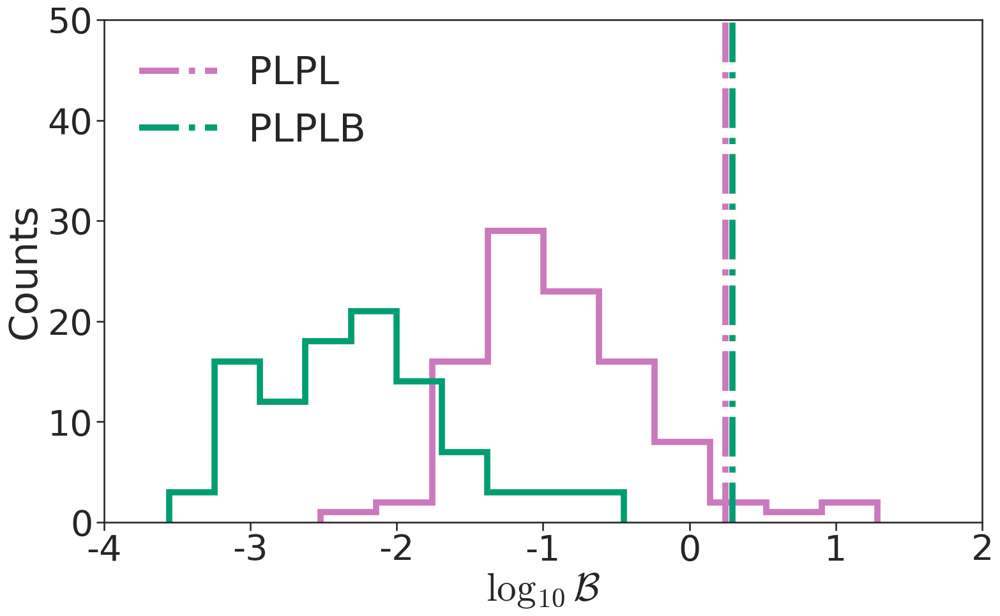

In [53]:
plt.figure(figsize=(16,10))

plt.hist(logBF_plpl,color=c[4],histtype='step', linewidth=7, facecolor=c[4], fill=False)#, bins=20)
plt.hist(logBF_plplbump,color=c[2],histtype='step', linewidth=7, facecolor=c[2], fill=False)#, bins=20)

plt.axvline(logBF_plpl_gwtc3, label='PLPL', color=c[4], ls='-.',linewidth=7)
plt.axvline(logBF_plplbump_gwtc3, label='PLPLB', color=c[2], ls='-.',linewidth=7)

plt.xlabel(r'$\log_{10}\mathcal{B}$',size=44)
plt.ylabel('Counts',size=44)
plt.legend(loc='upper left', fontsize=44,frameon=False)

plt.xticks(size=40)
plt.yticks(size=40)

plt.xlim(-4,2)
plt.ylim(0,50)
plt.tight_layout()
plt.savefig('figure2_bayesfactors.pdf')
plt.show()


In [25]:
np.where(logBF_plpl>0)[0].shape

(7,)

In [26]:

plbump_pm1s_ = np.array(plbump_pm1s)

plbump_m1s_5 = np.percentile(plbump_pm1s_,q=5,axis=0)
plbump_m1s_95 = np.percentile(plbump_pm1s_,q=95,axis=0)
plbump_m1s_med = np.percentile(plbump_pm1s_,q=50,axis=0)


plplbump_pm1s_ = np.array(plplbump_pm1s)

plplbump_m1s_5 = np.percentile(plplbump_pm1s_,q=5,axis=0)
plplbump_m1s_95 = np.percentile(plplbump_pm1s_,q=95,axis=0)
plplbump_m1s_med = np.percentile(plplbump_pm1s_,q=50,axis=0)


plpl_pm1s_ = np.array(plpl_pm1s)

plpl_m1s_5 = np.percentile(plpl_pm1s_,q=5,axis=0)
plpl_m1s_95 = np.percentile(plpl_pm1s_,q=95,axis=0)
plpl_m1s_med = np.percentile(plpl_pm1s_,q=50,axis=0)


In [27]:

plbump_pm2s_ = np.array(plbump_pm2s)

plbump_m2s_5 = np.percentile(plbump_pm2s_,q=5,axis=0)
plbump_m2s_95 = np.percentile(plbump_pm2s_,q=95,axis=0)
plbump_m2s_med = np.percentile(plbump_pm2s_,q=50,axis=0)


plplbump_pm2s_ = np.array(plplbump_pm2s)

plplbump_m2s_5 = np.percentile(plplbump_pm2s_,q=5,axis=0)
plplbump_m2s_95 = np.percentile(plplbump_pm2s_,q=95,axis=0)
plplbump_m2s_med = np.percentile(plplbump_pm2s_,q=50,axis=0)


plpl_pm2s_ = np.array(plpl_pm2s)

plpl_m2s_5 = np.percentile(plpl_pm2s_,q=5,axis=0)
plpl_m2s_95 = np.percentile(plpl_pm2s_,q=95,axis=0)
plpl_m2s_med = np.percentile(plpl_pm2s_,q=50,axis=0)


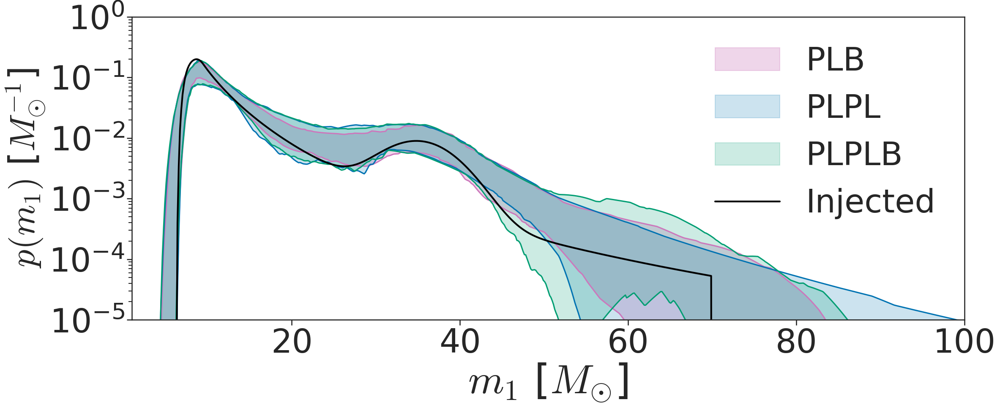

In [52]:

def mass_1_spectrum_plot(limits):
    """
    Generates a plot of the PPD and X% credible region for the mass distribution,
    where X=limits[1]-limits[0]
    """
    fig, axs = plt.subplots(figsize=(24,10))

    axs.fill_between(ms,plbump_m1s_5,plbump_m1s_95,alpha=0.3,color=c[4],label="PLB")
    axs.plot(ms,plbump_m1s_5,color=c[4])
    axs.plot(ms,plbump_m1s_95,color=c[4])
    axs.fill_between(ms,plpl_m1s_5,plpl_m1s_95,alpha=0.2,color=c[0],label="PLPL")
    axs.plot(ms,plpl_m1s_5,color=c[0])
    axs.plot(ms,plpl_m1s_95,color=c[0])
    axs.fill_between(ms,plplbump_m1s_5,plplbump_m1s_95,alpha=0.2,color=c[2],label="PLPLB")
    axs.plot(ms,plplbump_m1s_5,color=c[2])
    axs.plot(ms,plplbump_m1s_95,color=c[2])
    axs.plot(ms,pm1,color='black',label="Injected",linewidth=3)
    axs.set_xlim(1,100)
    axs.set_ylim(1e-5,1)
    axs.set_xlabel("$m_{1}$ [$M_{\\odot}$]",fontsize=70)
    axs.legend(loc="best",fontsize=55,frameon=False)
    ylabel = "$p(m_1)$ [$M_{\\odot}^{-1}$]"
    axs.set_ylabel(ylabel,fontsize=60)
    plt.xticks(fontsize=56)
    plt.yticks(fontsize=56)
    axs.set_yscale('log')
    plt.tight_layout()
    plt.savefig('figure3_m1_normed_sims.pdf')
    plt.show()
    return fig
    
fig = mass_1_spectrum_plot(limits=[5,95])


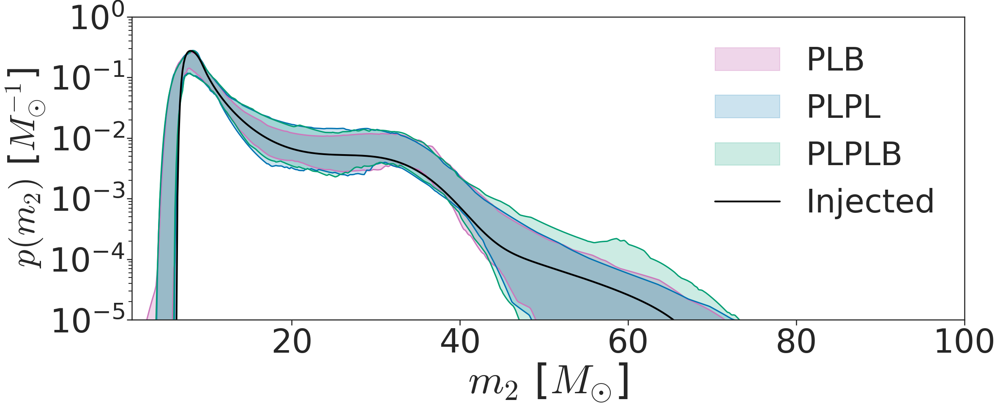

In [51]:
def mass_2_spectrum_plot(limits):
    """
    Generates a plot of the PPD and X% credible region for the mass distribution,
    where X=limits[1]-limits[0]
    """
    fig, axs = plt.subplots(figsize=(24,10))

    axs.fill_between(ms,plbump_m2s_5,plbump_m2s_95,alpha=0.3,color=c[4],label="PLB")
    axs.plot(ms,plbump_m2s_5,color=c[4])
    axs.plot(ms,plbump_m2s_95,color=c[4])
    axs.fill_between(ms,plpl_m2s_5,plpl_m2s_95,alpha=0.2,color=c[0],label="PLPL")
    axs.plot(ms,plpl_m2s_5,color=c[0])
    axs.plot(ms,plpl_m2s_95,color=c[0])
    axs.fill_between(ms,plplbump_m2s_5,plplbump_m2s_95,alpha=0.2,color=c[2],label="PLPLB")
    axs.plot(ms,plplbump_m2s_5,color=c[2])
    axs.plot(ms,plplbump_m2s_95,color=c[2])
    axs.plot(ms,pm2,color='black',label="Injected",linewidth=3)
    axs.set_xlim(1,100)
    axs.set_ylim(1e-5,1)
    axs.set_xlabel("$m_{2}$ [$M_{\\odot}$]",fontsize=70)
    axs.legend(loc="best",fontsize=55,frameon=False)
    ylabel = "$p(m_2)$ [$M_{\\odot}^{-1}$]"
    axs.set_ylabel(ylabel,fontsize=60)
    plt.xticks(fontsize=56)
    plt.yticks(fontsize=56)
    axs.set_yscale('log')
    plt.tight_layout()
    plt.savefig('figure3_m2_normed_sims.pdf')
    plt.show()
    
    return fig
    
fig = mass_2_spectrum_plot(limits=[5,95])


[]


100%|██████████| 100/100 [00:00<00:00, 547.32it/s]


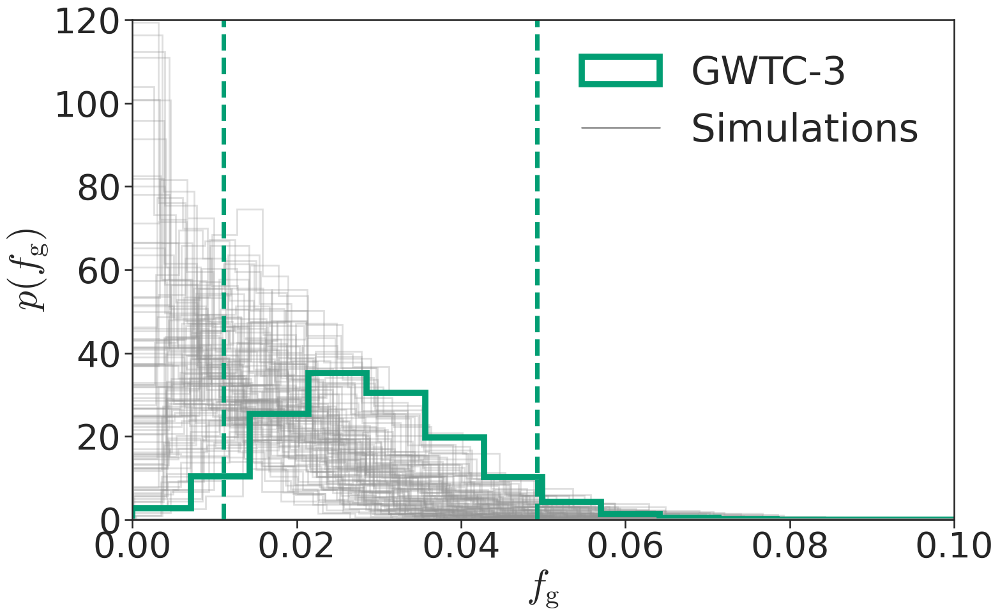

In [50]:
fracs = []
n_lessthan = []
n_tot = []
frac_GWTC3 = 1-post_samples_plplbump_GWTC3[0][:, -2]-post_samples_plplbump_GWTC3[0][:, -1]

# Transform to a numpy arry
data = np.array(frac_GWTC3)

# Get median, 5% and 95% quantiles
med = np.median(data)
upperLim = np.sort(data)[int(0.95*data.size)]
lowerLim = np.sort(data)[int(0.05*data.size)]

# Turn quantiles into upper and lower uncertainties
upperError = upperLim-med
lowerError = med-lowerLim

print(np.where(frac_GWTC3<0)[0])
for k in tqdm(range(len(post_samples_plplbump))):
    dpostsamples = post_samples_plplbump[k]
    frac = 1-dpostsamples[:, -2]-dpostsamples[:, -1]
    frac = frac[frac>0]
    
    fracs.append(frac)
    n_lessthan.append(np.where((frac<0.01))[0].shape[0])
    n_tot.append(len(frac))
    plt.hist(frac, color=c[7], alpha=0.3, density=True, histtype='step',bins=16,linewidth=2)
plt.hist(frac_GWTC3, color=c[2], histtype='step', linewidth=7, density=True, label='GWTC-3',bins=16)
plt.plot(np.linspace(-2,2,10),np.linspace(-2,2,10), color=c[7], linewidth=2,  label="Simulations")
plt.axvline(lowerLim, color=c[2], linewidth=5,  ls="--")
plt.axvline(upperLim, color=c[2], linewidth=5,  ls="--")
plt.xlabel(r'$f_{{\rm{g}}}$',size=44)
plt.ylabel(r'$p(f_{{\rm{g}}})$',size=44)
plt.legend(loc='upper right', fontsize=44,frameon=False)

plt.xticks(size=40)
plt.yticks(size=40)

plt.xlim(0,0.1)
plt.ylim(0,120)
plt.tight_layout()
plt.savefig('histogram_bump.pdf')
plt.show()


In [38]:
percent_below = np.array(n_lessthan)/np.array(n_tot)*100

n_below_GWTC3 = np.where((frac_GWTC3<0.01))[0].shape[0]
n_tot_GWTC3 = len(frac_GWTC3)
percent_below_GWTC3 = n_below_GWTC3/n_tot_GWTC3*100
print(percent_below_GWTC3)
print(100-percent_below_GWTC3)

3.9989668976798245
96.00103310232018


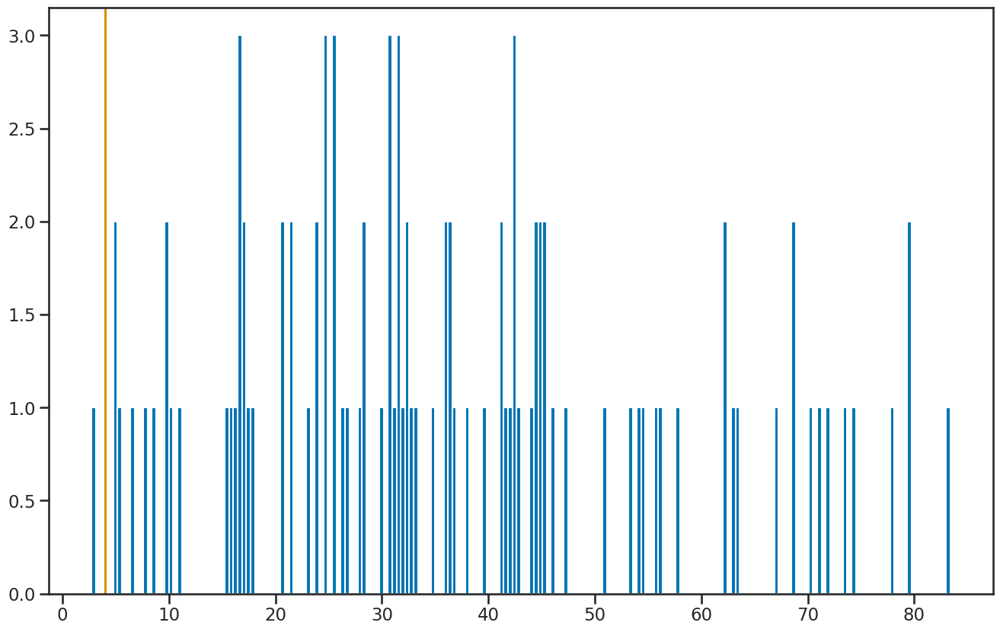

In [41]:
plt.hist(percent_below,bins=200)
plt.axvline(percent_below_GWTC3,color=c[1])
plt.show()

(array([62]),)


/tmp/ipykernel_3590784/3413406583.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(fracs[best_one])
/hildafs/home/magana/tmp_ondemand_hildafs_phy230014p_symlink/magana/.conda/envs/jax/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_3590784/3413406583.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with


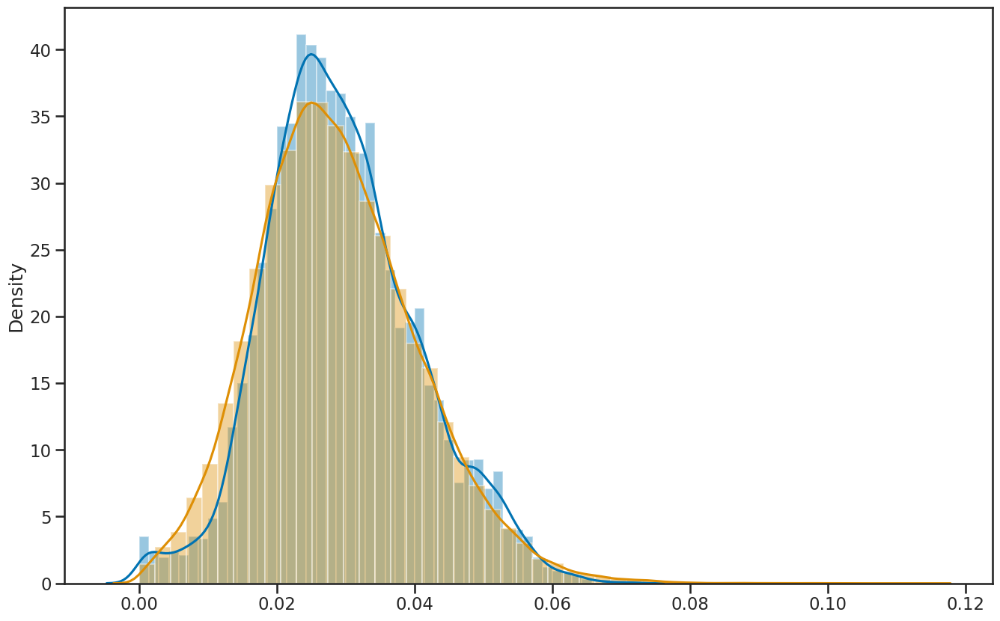

In [54]:
print(np.where(percent_below<4))
best_one = np.where(percent_below<4)[0][0]

sns.distplot(fracs[best_one])
sns.distplot(frac_GWTC3)
plt.show()

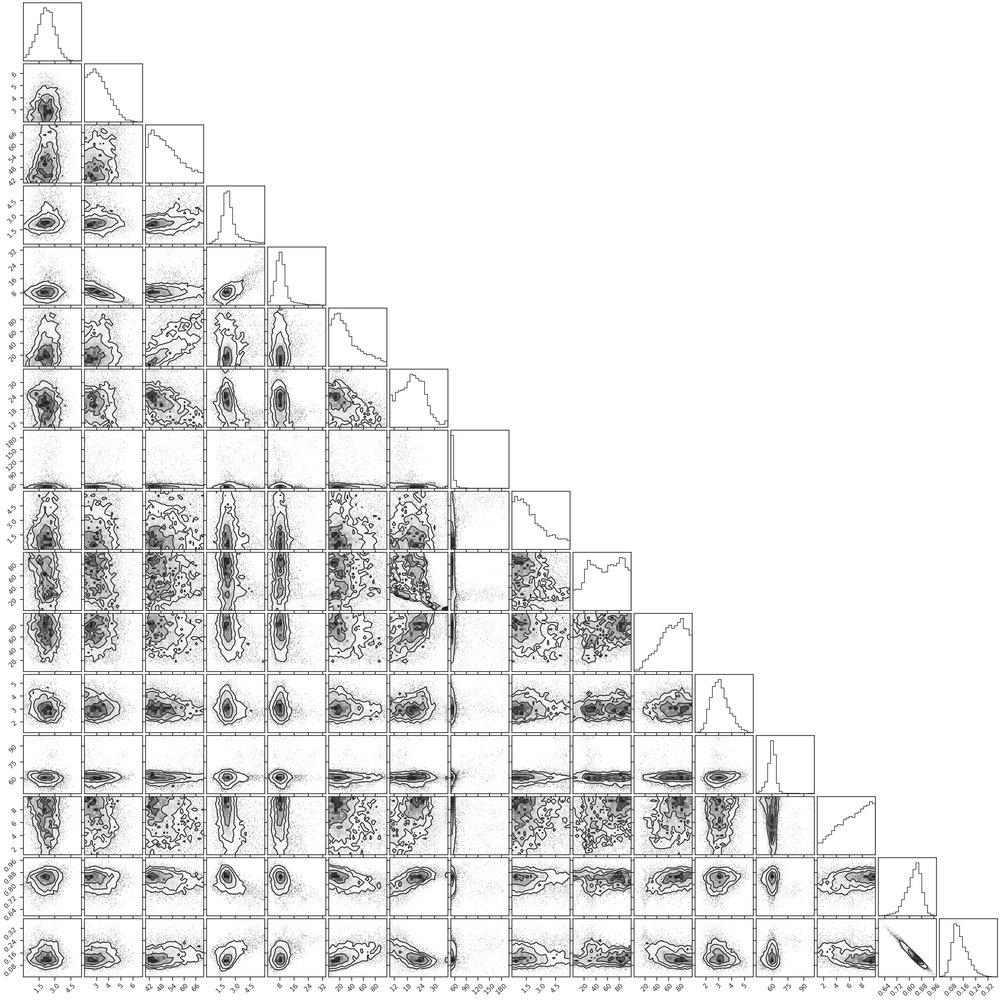

In [47]:
corner.corner(post_samples_plplbump[62])

100%|██████████| 1000/1000 [00:30<00:00, 32.79it/s]


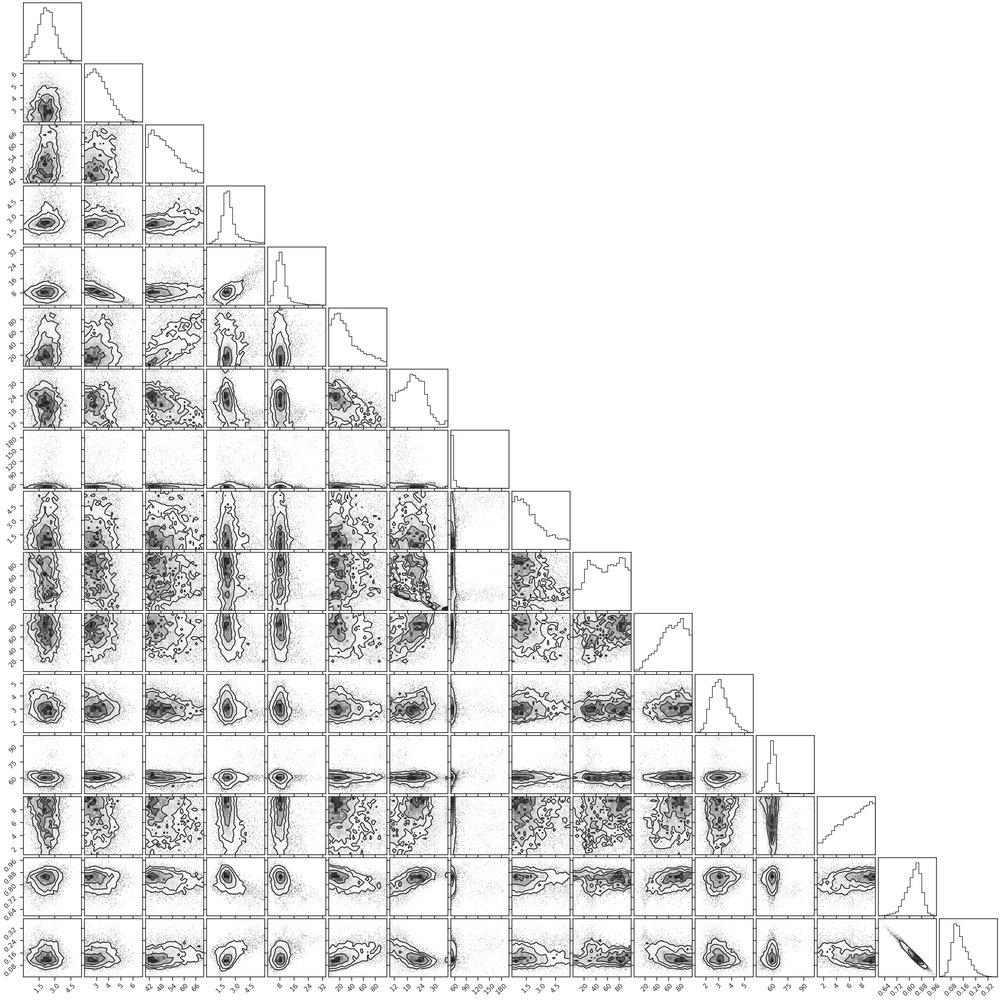

<Figure size 1600x1000 with 0 Axes>

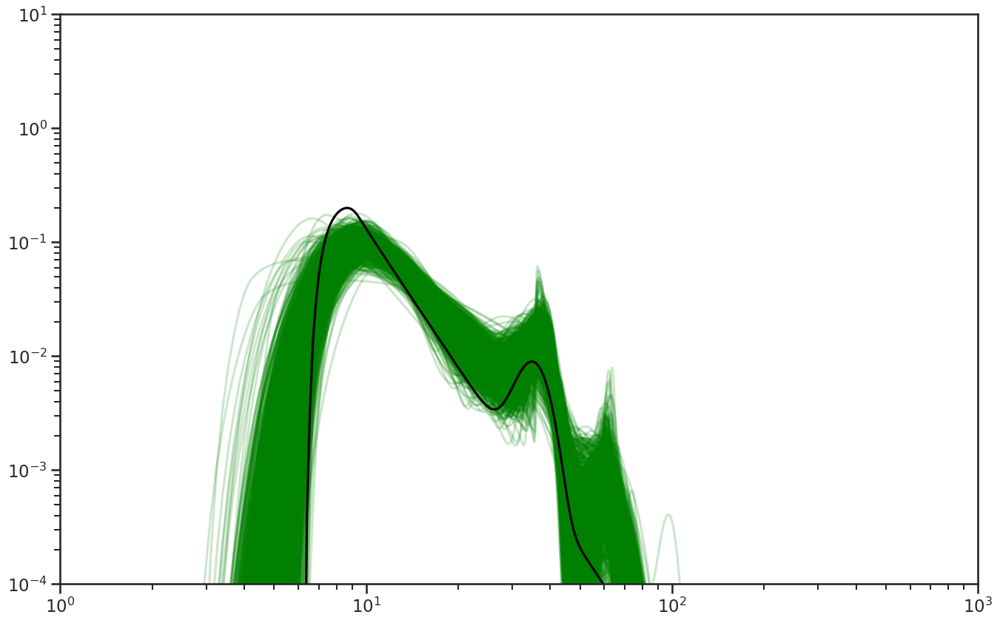

In [49]:
def log_pm1m2_powerlaw_powerlaw_peak(m1,m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2,beta):
    log_dNdm1 = logpm1_powerlaw_powerlaw_peak(m1,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2)
    log_dNdm2 = logpm1_powerlaw_powerlaw_peak(m2,m_min_1,m_max_1,alpha_1,dm_min_1,dm_max_1,m_min_2,m_max_2,alpha_2,dm_min_2,dm_max_2,mu,sigma,f1,f2)
    log_fq = logfq(m1,m2,beta)
    return log_dNdm1 + log_dNdm2 + log_fq

plt.figure()
for k in tqdm(range(1000)):
    
    dpostsamples = post_samples_plplbump[62][k]
    
    gamma_1 = dpostsamples[0]
    mmin_1 = dpostsamples[1]
    mmax_1 = dpostsamples[2]
    alpha_1 = dpostsamples[3]
    dm_mmin_1 = dpostsamples[4]
    dm_mmax_1 = dpostsamples[5]
    mmin_2 = dpostsamples[6]
    mmax_2 = dpostsamples[7]
    alpha_2 = dpostsamples[8]
    dm_mmin_2 = dpostsamples[9]
    dm_mmax_2 = dpostsamples[10]
    beta = dpostsamples[11]
    mu = dpostsamples[12]
    sigma = dpostsamples[13]
    f1 = dpostsamples[14]
    f2 = dpostsamples[15]
    
    pm1sm2s_fit = np.exp(log_pm1m2_powerlaw_powerlaw_peak(m1s,m2s,mmin_1,mmax_1,alpha_1,dm_mmin_1,dm_mmax_1,mmin_2,mmax_2,alpha_2,dm_mmin_2,dm_mmax_2,mu,sigma,f1,f2,beta))
    pm1sm2s_fit[m1s<m2s]=0.
    pm1sm2s_fit/=np.trapz(np.trapz(pm1sm2s_fit,ms,axis=0),ms)    
    pm1_fit = np.trapz(pm1sm2s_fit,ms,axis=0)
    pm2_fit = np.trapz(pm1sm2s_fit,ms,axis=1)    
    pm1_fit = pm1_fit/np.trapz(pm1_fit,ms)
    pm2_fit = pm2_fit/np.trapz(pm2_fit,ms)
    plplbump_pm1s.append(pm1_fit)
    plplbump_pm2s.append(pm2_fit)
    plt.loglog(ms,pm1_fit,alpha=0.2,color='green')    
plt.loglog(ms,pm1,color='black')
plt.xlim(1,1000)
plt.ylim(1e-4,10)
#plt.savefig('m1_'+str(run)+'.png')
plt.show()